### Import packages

In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import copy
import math

%matplotlib inline

In [17]:
%pip install ydata-profiling
from ydata_profiling import ProfileReport

### Read data

In [18]:
data = pd.read_csv("Student Depression Dataset.csv", thousands=',', skipinitialspace=True)
#data = pd.read_csv("churn-bigml-80.csv", thousands=',', skipinitialspace=True)
data

,id,Gender,Age,City,Profession,Academic Pressure,Work Pressure,CGPA,Study Satisfaction,Job Satisfaction,Sleep Duration,Dietary Habits,Degree,Have you ever had suicidal thoughts ?,Work/Study Hours,Financial Stress,Family History of Mental Illness,Depression
0,2,Male,33.0,Visakhapatnam,Student,5.0,0.0,8.97,2.0,0.0,5-6 hours,Healthy,B.Pharm,Yes,3.0,1.0,No,1
1,8,Female,24.0,Bangalore,Student,2.0,0.0,5.90,5.0,0.0,5-6 hours,Moderate,BSc,No,3.0,2.0,Yes,0
2,26,Male,31.0,Srinagar,Student,3.0,0.0,7.03,5.0,0.0,Less than 5 hours,Healthy,BA,No,9.0,1.0,Yes,0
3,30,Female,28.0,Varanasi,Student,3.0,0.0,5.59,2.0,0.0,7-8 hours,Moderate,BCA,Yes,4.0,5.0,Yes,1
4,32,Female,25.0,Jaipur,Student,4.0,0.0,8.13,3.0,0.0,5-6 hours,Moderate,M.Tech,Yes,1.0,1.0,No,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27896,140685,Female,27.0,Surat,Student,5.0,0.0,5.75,5.0,0.0,5-6 hours,Unhealthy,Class 12,Yes,7.0,1.0,Yes,0
27897,140686,Male,27.0,Ludhiana,Student,2.0,0.0,9.40,3.0,0.0,Less than 5 hours,Healthy,MSc,No,0.0,3.0,Yes,0
27898,140689,Male,31.0,Faridabad,Student,3.0,0.0,6.61,4.0,0.0,5-6 hours,Unhealthy,MD,No,12.0,2.0,No,0
27899,140690,Female,18.0,Ludhiana,Student,5.0,0.0,6.88,2.0,0.0,Less than 5 hours,Healthy,Class 12,Yes,10.0,5.0,No,1


In [19]:
data = data.drop(columns=['id', 'City', 'Profession', 'Degree'])


### Drop empty lines in data and remove NAN's

In [20]:
data = data.dropna()
data

,Gender,Age,Academic Pressure,Work Pressure,CGPA,Study Satisfaction,Job Satisfaction,Sleep Duration,Dietary Habits,Have you ever had suicidal thoughts ?,Work/Study Hours,Financial Stress,Family History of Mental Illness,Depression
0,Male,33.0,5.0,0.0,8.97,2.0,0.0,5-6 hours,Healthy,Yes,3.0,1.0,No,1
1,Female,24.0,2.0,0.0,5.90,5.0,0.0,5-6 hours,Moderate,No,3.0,2.0,Yes,0
2,Male,31.0,3.0,0.0,7.03,5.0,0.0,Less than 5 hours,Healthy,No,9.0,1.0,Yes,0
3,Female,28.0,3.0,0.0,5.59,2.0,0.0,7-8 hours,Moderate,Yes,4.0,5.0,Yes,1
4,Female,25.0,4.0,0.0,8.13,3.0,0.0,5-6 hours,Moderate,Yes,1.0,1.0,No,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27896,Female,27.0,5.0,0.0,5.75,5.0,0.0,5-6 hours,Unhealthy,Yes,7.0,1.0,Yes,0
27897,Male,27.0,2.0,0.0,9.40,3.0,0.0,Less than 5 hours,Healthy,No,0.0,3.0,Yes,0
27898,Male,31.0,3.0,0.0,6.61,4.0,0.0,5-6 hours,Unhealthy,No,12.0,2.0,No,0
27899,Female,18.0,5.0,0.0,6.88,2.0,0.0,Less than 5 hours,Healthy,Yes,10.0,5.0,No,1


In [21]:
data = pd.get_dummies(data, drop_first=True)
data


,Age,Academic Pressure,Work Pressure,CGPA,Study Satisfaction,Job Satisfaction,Work/Study Hours,Financial Stress,Depression,Gender_Male,Sleep Duration_7-8 hours,Sleep Duration_Less than 5 hours,Sleep Duration_More than 8 hours,Sleep Duration_Others,Dietary Habits_Moderate,Dietary Habits_Others,Dietary Habits_Unhealthy,Have you ever had suicidal thoughts ?_Yes,Family History of Mental Illness_Yes
0,33.0,5.0,0.0,8.97,2.0,0.0,3.0,1.0,1,True,False,False,False,False,False,False,False,True,False
1,24.0,2.0,0.0,5.90,5.0,0.0,3.0,2.0,0,False,False,False,False,False,True,False,False,False,True
2,31.0,3.0,0.0,7.03,5.0,0.0,9.0,1.0,0,True,False,True,False,False,False,False,False,False,True
3,28.0,3.0,0.0,5.59,2.0,0.0,4.0,5.0,1,False,True,False,False,False,True,False,False,True,True
4,25.0,4.0,0.0,8.13,3.0,0.0,1.0,1.0,0,False,False,False,False,False,True,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27896,27.0,5.0,0.0,5.75,5.0,0.0,7.0,1.0,0,False,False,False,False,False,False,False,True,True,True
27897,27.0,2.0,0.0,9.40,3.0,0.0,0.0,3.0,0,True,False,True,False,False,False,False,False,False,True
27898,31.0,3.0,0.0,6.61,4.0,0.0,12.0,2.0,0,True,False,False,False,False,False,False,True,False,False
27899,18.0,5.0,0.0,6.88,2.0,0.0,10.0,5.0,1,False,False,True,False,False,False,False,False,True,False


### Reset the index for potentially removed rows in data

In [22]:
data = data.reset_index(drop=True)

## EDA - Exploratory Data Analysis

### View data statistics - short format

In [23]:
data.describe()

,Age,Academic Pressure,Work Pressure,CGPA,Study Satisfaction,Job Satisfaction,Work/Study Hours,Financial Stress,Depression
count,27898.000000,27898.000000,27898.000000,27898.000000,27898.000000,27898.000000,27898.000000,27898.000000,27898.000000
mean,25.822174,3.141336,0.000430,7.656160,2.943974,0.000681,7.156570,3.139867,0.585526
std,4.905651,1.381462,0.043994,1.470708,1.361122,0.044397,3.707598,1.437347,0.492640
min,18.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
25%,21.000000,2.000000,0.000000,6.290000,2.000000,0.000000,4.000000,2.000000,0.000000
50%,25.000000,3.000000,0.000000,7.770000,3.000000,0.000000,8.000000,3.000000,1.000000
75%,30.000000,4.000000,0.000000,8.920000,4.000000,0.000000,10.000000,4.000000,1.000000
max,59.000000,5.000000,5.000000,10.000000,5.000000,4.000000,12.000000,5.000000,1.000000


### View data statistics - long format

In [24]:


profile = ProfileReport(data, title="Student Depression Dataset Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 19/19 [00:00<00:00, 44.88it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [25]:
from sklearn.utils import resample

# Split pe clase
data_majority = data[data['Depression'] == 1]
data_minority = data[data['Depression'] == 0]

# Downsample clasa 1
data_majority_downsampled = resample(data_majority,
                                     replace=False,
                                     n_samples=len(data_minority),
                                     random_state=42)

# Combinați
data_balanced = pd.concat([data_minority, data_majority_downsampled])


#### Important: We have 41.45% samples with no depresion and 58.55% depresion samples in our dataset

### Change categorical string/boolean columns to categorical integer columns

In [26]:
data

,Age,Academic Pressure,Work Pressure,CGPA,Study Satisfaction,Job Satisfaction,Work/Study Hours,Financial Stress,Depression,Gender_Male,Sleep Duration_7-8 hours,Sleep Duration_Less than 5 hours,Sleep Duration_More than 8 hours,Sleep Duration_Others,Dietary Habits_Moderate,Dietary Habits_Others,Dietary Habits_Unhealthy,Have you ever had suicidal thoughts ?_Yes,Family History of Mental Illness_Yes
0,33.0,5.0,0.0,8.97,2.0,0.0,3.0,1.0,1,True,False,False,False,False,False,False,False,True,False
1,24.0,2.0,0.0,5.90,5.0,0.0,3.0,2.0,0,False,False,False,False,False,True,False,False,False,True
2,31.0,3.0,0.0,7.03,5.0,0.0,9.0,1.0,0,True,False,True,False,False,False,False,False,False,True
3,28.0,3.0,0.0,5.59,2.0,0.0,4.0,5.0,1,False,True,False,False,False,True,False,False,True,True
4,25.0,4.0,0.0,8.13,3.0,0.0,1.0,1.0,0,False,False,False,False,False,True,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27893,27.0,5.0,0.0,5.75,5.0,0.0,7.0,1.0,0,False,False,False,False,False,False,False,True,True,True
27894,27.0,2.0,0.0,9.40,3.0,0.0,0.0,3.0,0,True,False,True,False,False,False,False,False,False,True
27895,31.0,3.0,0.0,6.61,4.0,0.0,12.0,2.0,0,True,False,False,False,False,False,False,True,False,False
27896,18.0,5.0,0.0,6.88,2.0,0.0,10.0,5.0,1,False,False,True,False,False,False,False,False,True,False


### Create x and y from original data

In [27]:
x_data = data.drop('Depression', axis=1).astype(float).values
y_data = data['Depression'].values


In [28]:
print("X shape:", x_data.shape)
print("y shape:", y_data.shape)


X shape: (27898, 18)
y shape: (27898,)


In [29]:
x_data

array([[33.,  5.,  0., ...,  0.,  1.,  0.],
       [24.,  2.,  0., ...,  0.,  0.,  1.],
       [31.,  3.,  0., ...,  0.,  0.,  1.],
       ...,
       [31.,  3.,  0., ...,  1.,  0.,  0.],
       [18.,  5.,  0., ...,  0.,  1.,  0.],
       [27.,  4.,  0., ...,  0.,  1.,  1.]])

### Split data into training and validation datasets: Default 80% train, 20% validation

In [30]:
x_train, x_validation, y_train, y_validation = train_test_split(x_data, y_data, test_size=0.2, random_state=42, stratify=y_data)

### Visualize how one sample looks like

In [31]:
import numpy as np

x_train = np.array(x_train)
x_validation = np.array(x_validation)
y_train = np.array(y_train)
y_validation = np.array(y_validation)

In [32]:
x_train[0]

array([18.  ,  3.  ,  0.  ,  9.96,  5.  ,  0.  ,  2.  ,  4.  ,  0.  ,
        1.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  1.  ,  1.  ])

### Visualize the nuber of training samples and number of validation samples

In [33]:
len(y_train), len(y_validation)

(22318, 5580)

### Visualize the number of no churn vs churn samples in training dataset

In [34]:
np.unique(y_train, return_counts=True)

(array([0, 1]), array([ 9250, 13068]))

In [35]:
np.unique(y_validation, return_counts=True)

(array([0, 1]), array([2313, 3267]))

In [36]:
print("type:", type(x_train))
print("shape:", x_train.shape)
print("first row:", x_train[0])



type: <class 'numpy.ndarray'>
shape: (22318, 18)
first row: [18.    3.    0.    9.96  5.    0.    2.    4.    0.    1.    0.    0.
  0.    0.    0.    0.    1.    1.  ]


### Standardization - mean and standard deviation calculation

In [37]:
del np
import numpy as np


mean = np.mean(x_train, axis=0)
sigma = np.std(x_train, axis=0)



In [38]:
x_train = (x_train - mean) / sigma


### Very important! Validation dataset MUST BE standardized using mean and standard deviation calculated from the training dataset

In [39]:
x_validation = (x_validation - mean) / sigma

### View min and max values after standardization from training dataset

In [40]:
x_train.min(), x_train.max()

(np.float64(-5.200797273644554), np.float64(138.7036336288252))

### View min and max values after standardization from training dataset

In [41]:
x_validation.min(), x_validation.max()

(np.float64(-5.200797273644554), np.float64(138.7036336288252))

### Logistic Regression implementation

In [42]:
def sigmoid(x):
    g = 1 / (1 + np.exp(-x))
    return g

#### Examples of using sigmoid values

In [43]:
sigmoid(1)

np.float64(0.7310585786300049)

In [44]:
sigmoid(0)

np.float64(0.5)

In [45]:
sigmoid(-1)

np.float64(0.2689414213699951)

In [46]:
sigmoid(-1000)

<ipython-input-42-0b81d26b1f5a>:2: RuntimeWarning: overflow encountered in exp
  g = 1 / (1 + np.exp(-x))


np.float64(0.0)

In [47]:
sigmoid(100)

np.float64(1.0)

In [48]:
mean = np.mean(x_train, axis=0)
sigma = np.std(x_train, axis=0)
x_train = (x_train - mean) / sigma
x_validation = (x_validation - mean) / sigma


In [49]:

def compute_cost(X, y, w, b, lambda_=1):
    m = X.shape[0]
    cost = 0.0
    for i in range(m):
        z_i = np.dot(X[i],w) + b
        f_wb_i = sigmoid(z_i)
        cost +=  -y[i] * np.log(f_wb_i) - (1 - y[i]) * np.log(1 - f_wb_i)

    cost = cost / m
    return cost

In [50]:
def compute_gradient(X, y, w, b, lambda_=1):
    m,n = X.shape
    dj_dw = np.zeros((n,))                           #(n,)
    dj_db = 0.

    for i in range(m):
        f_wb_i = sigmoid(np.dot(X[i], w) + b)          #(n,)(n,)=scalar
        err_i  = f_wb_i  - y[i]                       #scalar
        for j in range(n):
            dj_dw[j] += err_i * X[i,j]      #scalar
        dj_db += err_i
    dj_dw = dj_dw/m                                   #(n,)
    dj_db = dj_db/m                                   #scalar

    return dj_db, dj_dw

In [51]:
def gradient_descent(x_train, y_train, x_validation, y_validation, w_in, b_in, cost_function, gradient_function, alpha, num_iters, lambda_=1):
    # number of training examples
    m = len(x_train)

    # An array to store cost J and w's at each iteration primarily for graphing later
    J_train_history = []
    J_valid_history = []
    w_history = []

    best_train_score = cost_function(x_train, y_train, w_in, b_in, lambda_)
    best_validation_score = cost_valid =  compute_cost(x_validation, y_validation, w_in, b_in, lambda_)
    best_w_in_train = copy.deepcopy(w_in)
    best_b_train = copy.deepcopy(b_in)
    best_w_in_valid = copy.deepcopy(w_in)
    best_b_valid = copy.deepcopy(b_in)

    for i in range(num_iters):

        # Calculate the gradient and update the parameters
        dj_db, dj_dw = gradient_function(x_train, y_train, w_in, b_in, lambda_)

        # Update Parameters using w, b, alpha and gradient
        w_in = w_in - alpha * dj_dw
        b_in = b_in - alpha * dj_db

        cost_train =  cost_function(x_train, y_train, w_in, b_in, lambda_)
        J_train_history.append(cost_train)

        cost_valid =  compute_cost(x_validation, y_validation, w_in, b_in, lambda_)
        J_valid_history.append(cost_valid)

        if best_train_score > cost_train:
            best_train_score = cost_train
            np.save(f'model/best_train_w_in.npy', w_in)    # .npy extension is added if not given
            np.save(f'model/best_train_b.npy', b_in)


        if best_validation_score > cost_valid:
            best_validation_score = cost_valid
            np.save(f'model/best_valid_w_in.npy', w_in)    # .npy extension is added if not given
            np.save(f'model/best_valid_b.npy', b_in)

        # Print cost every at intervals 10 times or as many iterations if < 10
        if i % math.ceil(num_iters/10) == 0 or i == (num_iters-1):
            w_history.append(w_in)
            print(f"Iteration {i:4}: Cost Train: {float(J_train_history[-1].squeeze()):f} \t  Cost Validation: {float(J_valid_history[-1].squeeze()):f}")

    return w_in, b_in, J_train_history, J_valid_history, w_history #return w and J,w history for graphing

In [66]:
initial_w = np.zeros(len(x_train[0]))
initial_b = 0

# Some gradient descent settings
iterations = 1000
alpha = 0.01
lambda_ = 0
import os
os.makedirs("model", exist_ok=True)

w_final, b_final, J_train_history, J_valid_history, _ = gradient_descent(x_train=x_train, y_train=y_train, x_validation=x_validation, y_validation=y_validation, w_in=initial_w, b_in=initial_b, cost_function=compute_cost, gradient_function=compute_gradient, alpha=alpha, num_iters=iterations, lambda_=lambda_)

Iteration    0: Cost Train: 0.691055 	  Cost Validation: 0.691052
Iteration  100: Cost Train: 0.546926 	  Cost Validation: 0.547106
Iteration  200: Cost Train: 0.476539 	  Cost Validation: 0.477246
Iteration  300: Cost Train: 0.437528 	  Cost Validation: 0.438788
Iteration  400: Cost Train: 0.413613 	  Cost Validation: 0.415385
Iteration  500: Cost Train: 0.397850 	  Cost Validation: 0.400082
Iteration  600: Cost Train: 0.386894 	  Cost Validation: 0.389537
Iteration  700: Cost Train: 0.378970 	  Cost Validation: 0.381980
Iteration  800: Cost Train: 0.373061 	  Cost Validation: 0.376400
Iteration  900: Cost Train: 0.368544 	  Cost Validation: 0.372180
Iteration  999: Cost Train: 0.365053 	  Cost Validation: 0.368956


In [67]:
best_w_final = np.load('model/best_valid_w_in.npy')
best_b_final = np.load('model/best_valid_b.npy')

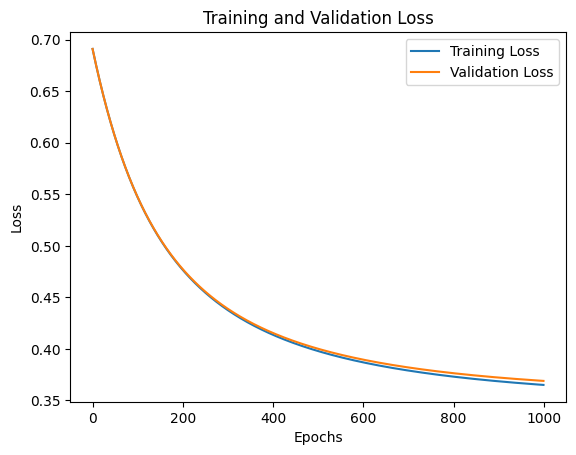

In [68]:
# Generate a sequence of integers to represent the epoch numbers
#epochs = range(1, iterations+1)

# Plot and label the training and validation loss values
plt.plot(J_train_history, label='Training Loss')
plt.plot(J_valid_history, label='Validation Loss')

# Add in a title and axes labels
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')

# Set the tick locations
#plt.xticks(np.arange(0, iterations+1, 2))

# Display the plot
plt.legend(loc='best')
plt.show()

In [69]:
def predict(X, w, b):
    # number of training examples
    m, n = X.shape
    p = np.zeros(m)

    for i in range(m):
        z_wb = 0
        # Loop over each feature
        for j in range(n):
            # Add the corresponding term to z_wb
            z_wb += X[i][j] * w[j]

        # Add bias term
        z_wb += b

        # Calculate the prediction for this example
        f_wb = sigmoid(z_wb)

        # Apply the threshold
        p[i] = f_wb >= 0.5

    return p

In [70]:
y_predicted = predict(x_train, w_final, b_final)

In [71]:
y_train.shape

(22318,)

In [72]:
y_train.reshape(-1).shape, y_predicted.shape

((22318,), (22318,))

In [73]:
(y_train.reshape(-1) == y_predicted).sum()

np.int64(18889)

In [74]:
x_train.shape
x_train.shape

(22318, 18)

In [75]:
y_train = y_train.reshape(-1)

In [76]:
type(y_predicted)

numpy.ndarray

In [77]:
def metrics_computations(x:np.array,
                         y_true:np.array,
                         y_predicted: np.array):
    total_number_of_samples = x.shape[0]
    accuracy = (y_true == y_predicted).sum() / total_number_of_samples
    true_positive = ((y_predicted == 1) & (y_true == 1)).sum()
    false_positive = ((y_predicted == 1) & (y_true == 0)).sum()
    false_negative = ((y_predicted == 0) & (y_true == 1)).sum()
    true_negative = ((y_predicted == 0) & (y_true == 0)).sum()

    precision = true_positive / (true_positive + false_positive)
    recall = true_positive / (true_positive + false_negative)
    specificity = true_negative / (true_negative + false_positive)
    f1_score = (2 * precision * recall) / (precision + recall)

    false_negative_rate = false_negative / (false_negative + true_positive)
    false_positive_rate = false_positive / (false_positive + true_negative)

    return (accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate)

In [78]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_train,
                                                                                                                     y_true=y_train,
                                                                                                                     y_predicted=y_predicted)

In [79]:
print(f"[TRAIN] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[TRAIN] Accuracy: 84.64% 
 Precision: 85.96% 
 Recall: 88.16% 
 F1 Score: 87.05% 
 Specificity: 79.65% 
 False Positive Rate: 20.35% 
 False Negative Rate: 11.84%


In [80]:
y_predicted_validation = predict(x_validation, w_final, b_final)

In [81]:
y_validation = y_validation.reshape(-1)

In [82]:
for i, j in zip(y_validation, y_predicted_validation):
    print(i, j)

0 1.0
1 1.0
0 0.0
1 0.0
1 1.0
0 1.0
0 0.0
1 1.0
1 1.0
0 0.0
0 0.0
1 0.0
0 0.0
1 1.0
1 1.0
1 1.0
1 1.0
1 1.0
1 1.0
1 1.0
1 1.0
1 0.0
1 1.0
1 1.0
1 1.0
0 0.0
0 0.0
1 1.0
1 0.0
1 1.0
0 0.0
1 1.0
1 1.0
1 1.0
1 1.0
1 1.0
0 1.0
0 0.0
0 0.0
1 1.0
0 0.0
1 1.0
0 1.0
0 0.0
1 1.0
1 1.0
0 0.0
1 1.0
0 0.0
1 1.0
1 1.0
0 0.0
1 1.0
1 1.0
0 0.0
1 1.0
1 1.0
1 1.0
0 0.0
0 0.0
1 1.0
0 0.0
0 1.0
0 0.0
1 1.0
0 0.0
0 0.0
1 0.0
0 0.0
1 1.0
0 0.0
1 1.0
0 0.0
1 1.0
1 1.0
1 1.0
0 1.0
0 0.0
1 1.0
0 0.0
0 0.0
0 0.0
0 0.0
1 1.0
1 0.0
1 1.0
1 1.0
0 0.0
1 1.0
0 0.0
1 1.0
1 1.0
0 0.0
0 1.0
1 1.0
1 0.0
1 1.0
1 1.0
0 1.0
0 0.0
0 0.0
1 1.0
1 1.0
1 1.0
0 0.0
1 1.0
1 1.0
1 1.0
0 0.0
0 0.0
1 1.0
1 1.0
0 1.0
1 1.0
0 0.0
0 0.0
0 1.0
0 0.0
0 0.0
1 1.0
0 0.0
0 0.0
1 0.0
0 0.0
1 1.0
1 1.0
1 1.0
0 0.0
1 1.0
0 0.0
0 0.0
0 1.0
1 0.0
1 1.0
1 1.0
0 1.0
1 1.0
0 0.0
1 1.0
0 0.0
1 0.0
1 1.0
0 0.0
0 0.0
0 0.0
0 0.0
1 1.0
0 0.0
1 1.0
1 1.0
0 1.0
0 1.0
1 1.0
1 0.0
0 0.0
1 1.0
1 1.0
1 1.0
1 1.0
0 0.0
0 0.0
0 1.0
1 1.0
1 1.0
0 0.0
1 1.0
0 0.

In [83]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_validation,
                                                                                                                     y_true=y_validation,
                                                                                                                     y_predicted=y_predicted_validation)

In [84]:
print(f"[Valid] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[Valid] Accuracy: 84.64% 
 Precision: 86.25% 
 Recall: 87.76% 
 F1 Score: 87.00% 
 Specificity: 80.24% 
 False Positive Rate: 19.76% 
 False Negative Rate: 12.24%


### Analyze the feature importance

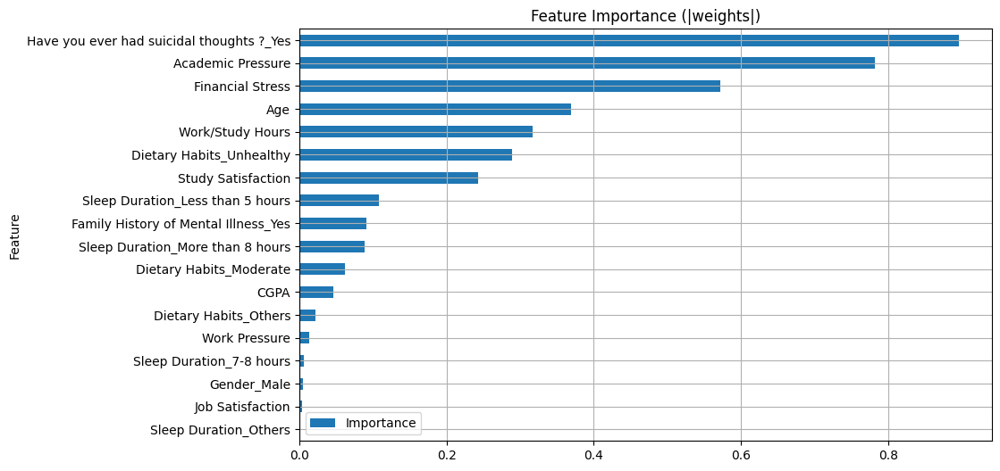

In [85]:
import pandas as pd
import numpy as np
import copy
import matplotlib.pyplot as plt

coefficients = copy.deepcopy(w_final)

# Preluăm numele coloanelor din DataFrame-ul original
feature_names = data.drop('Depression', axis=1).columns

feature_importance = pd.DataFrame({
    'Feature': feature_names,
    'Importance': np.abs(coefficients)
})

feature_importance = feature_importance.sort_values('Importance', ascending=True)

# Plot
feature_importance.plot(x='Feature', y='Importance', kind='barh', figsize=(10, 6))
plt.title("Feature Importance (|weights|)")
plt.grid(True)
plt.show()

### Add polynomial features for improving model capacity

In [86]:
#pip install scikit-learn
from sklearn import preprocessing

In [87]:
poly = preprocessing.PolynomialFeatures(2, interaction_only=False, include_bias=False)

In [88]:
poly_values = poly.fit_transform(x_data)
poly_values

array([[33.,  5.,  0., ...,  1.,  0.,  0.],
       [24.,  2.,  0., ...,  0.,  0.,  1.],
       [31.,  3.,  0., ...,  0.,  0.,  1.],
       ...,
       [31.,  3.,  0., ...,  0.,  0.,  0.],
       [18.,  5.,  0., ...,  1.,  0.,  0.],
       [27.,  4.,  0., ...,  1.,  1.,  1.]])

In [89]:
feature_names = data.drop("Depression", axis=1).columns
poly_column_names = list(poly.get_feature_names_out(feature_names))


In [90]:
x_data = pd.DataFrame(poly_values, columns=poly_column_names)
x_data

,Age,Academic Pressure,Work Pressure,CGPA,Study Satisfaction,Job Satisfaction,Work/Study Hours,Financial Stress,Gender_Male,Sleep Duration_7-8 hours,...,Dietary Habits_Others^2,Dietary Habits_Others Dietary Habits_Unhealthy,Dietary Habits_Others Have you ever had suicidal thoughts ?_Yes,Dietary Habits_Others Family History of Mental Illness_Yes,Dietary Habits_Unhealthy^2,Dietary Habits_Unhealthy Have you ever had suicidal thoughts ?_Yes,Dietary Habits_Unhealthy Family History of Mental Illness_Yes,Have you ever had suicidal thoughts ?_Yes^2,Have you ever had suicidal thoughts ?_Yes Family History of Mental Illness_Yes,Family History of Mental Illness_Yes^2
0,33.0,5.0,0.0,8.97,2.0,0.0,3.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,24.0,2.0,0.0,5.90,5.0,0.0,3.0,2.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,31.0,3.0,0.0,7.03,5.0,0.0,9.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,28.0,3.0,0.0,5.59,2.0,0.0,4.0,5.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0
4,25.0,4.0,0.0,8.13,3.0,0.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27893,27.0,5.0,0.0,5.75,5.0,0.0,7.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0
27894,27.0,2.0,0.0,9.40,3.0,0.0,0.0,3.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
27895,31.0,3.0,0.0,6.61,4.0,0.0,12.0,2.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
27896,18.0,5.0,0.0,6.88,2.0,0.0,10.0,5.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [91]:
x_data.columns

Index(['Age', 'Academic Pressure', 'Work Pressure', 'CGPA',
       'Study Satisfaction', 'Job Satisfaction', 'Work/Study Hours',
       'Financial Stress', 'Gender_Male', 'Sleep Duration_7-8 hours',
       ...
       'Dietary Habits_Others^2',
       'Dietary Habits_Others Dietary Habits_Unhealthy',
       'Dietary Habits_Others Have you ever had suicidal thoughts ?_Yes',
       'Dietary Habits_Others Family History of Mental Illness_Yes',
       'Dietary Habits_Unhealthy^2',
       'Dietary Habits_Unhealthy Have you ever had suicidal thoughts ?_Yes',
       'Dietary Habits_Unhealthy Family History of Mental Illness_Yes',
       'Have you ever had suicidal thoughts ?_Yes^2',
       'Have you ever had suicidal thoughts ?_Yes Family History of Mental Illness_Yes',
       'Family History of Mental Illness_Yes^2'],
      dtype='object', length=189)

### Split data into training and validation datasets: Default 80% train, 20% validation

In [92]:
x_train, x_validation, y_train, y_validation = train_test_split(x_data, y_data, test_size=0.2, random_state=42, stratify=y_data)

### Visualize how one sample looks like

### Visualize the nuber of training samples and number of validation samples

In [95]:
len(y_train), len(y_validation)

(22318, 5580)

In [96]:
np.unique(y_validation, return_counts=True)

(array([0, 1]), array([2313, 3267]))

### Standardization - mean and standard deviation calculation

In [97]:
mean   = np.mean(poly_values, axis=0)
sigma  = np.std(poly_values, axis=0)

In [98]:
poly_values = (poly_values - mean) / sigma

<ipython-input-98-1c996a941d87>:1: RuntimeWarning: invalid value encountered in divide
  poly_values = (poly_values - mean) / sigma


In [99]:
x_train, x_validation, y_train, y_validation = train_test_split(
    poly_values, y_data, test_size=0.2, random_state=42, stratify=y_data
)

### Train with polynomial features

In [127]:
import numpy as np


x_train[np.isinf(x_train)]       = np.nan
x_validation[np.isinf(x_validation)] = np.nan


good_cols = ~np.isnan(x_train).any(axis=0)

x_train      = x_train[:, good_cols]
x_validation = x_validation[:, good_cols]


good_rows = ~np.isnan(x_train).any(axis=1)
x_train      = x_train[good_rows]
y_train      = y_train[good_rows]



print("Shape before:", x_train.shape)
print("Shape after: ", x_train_clean.shape)
print("Any NaN train_clean?   ", np.any(np.isnan(x_train_clean)))
print("Any Inf train_clean?   ", np.any(np.isinf(x_train_clean)))


Shape before: (22318, 169)
Shape after:  (22318, 169)
Any NaN train_clean?    False
Any Inf train_clean?    False


In [128]:
x_train.shape

(22318, 169)

In [129]:
y_train.shape

(22318,)

In [130]:
x_validation.shape

(5580, 169)

In [131]:
y_validation.shape

(5580,)

In [132]:
print(np.any(np.isnan(x_train)), np.any(np.isinf(x_train)))

False False


In [133]:
def gradient_descent(x_train, y_train, x_validation, y_validation, w_in, b_in, cost_function, gradient_function, alpha, num_iters, lambda_=1):
    # number of training examples
    m = len(x_train)

    # An array to store cost J and w's at each iteration primarily for graphing later
    J_train_history = []
    J_valid_history = []
    w_history = []

    best_train_score = cost_function(x_train, y_train, w_in, b_in, lambda_)
    best_validation_score = cost_valid =  compute_cost(x_validation, y_validation, w_in, b_in, lambda_)
    best_w_in_train = copy.deepcopy(w_in)
    best_b_train = copy.deepcopy(b_in)
    best_w_in_valid = copy.deepcopy(w_in)
    best_b_valid = copy.deepcopy(b_in)

    for i in range(num_iters):

        # Calculate the gradient and update the parameters
        dj_db, dj_dw = gradient_function(x_train, y_train, w_in, b_in, lambda_)

        # Update Parameters using w, b, alpha and gradient
        w_in = w_in - alpha * dj_dw
        b_in = b_in - alpha * dj_db

        cost_train =  cost_function(x_train, y_train, w_in, b_in, lambda_)
        J_train_history.append(cost_train)

        cost_valid =  compute_cost(x_validation, y_validation, w_in, b_in, lambda_)
        J_valid_history.append(cost_valid)

        if best_train_score > cost_train:
            best_train_score = cost_train
            np.save(f'model/best_poly_train_w_in.npy', w_in)    # .npy extension is added if not given
            np.save(f'model/best_poly_train_b.npy', b_in)


        if best_validation_score > cost_valid:
            best_validation_score = cost_valid
            np.save(f'model/best_poly_valid_w_in.npy', w_in)    # .npy extension is added if not given
            np.save(f'model/best_poly_valid_b.npy', b_in)

        # Print cost every at intervals 10 times or as many iterations if < 10
        if i % math.ceil(num_iters/10) == 0 or i == (num_iters-1):
            w_history.append(w_in)
            print(f"Iteration {i:4}: Cost Train: {float(J_train_history[-1].squeeze()):f} \t  Cost Validation: {float(J_valid_history[-1].squeeze()):f}")

    return w_in, b_in, J_train_history, J_valid_history, w_history #return w and J,w history for graphing

In [136]:
initial_w = np.zeros(len(x_train[0]))
initial_b = 0

# Some gradient descent settings
iterations = 1000
alpha = 1
lambda_ = 0

w_final, b_final, J_train_history, J_valid_history, _ = gradient_descent(x_train=x_train, y_train=y_train, x_validation=x_validation, y_validation=y_validation, w_in=initial_w, b_in=initial_b, cost_function=compute_cost, gradient_function=compute_gradient, alpha=alpha, num_iters=iterations, lambda_=lambda_)

Iteration    0: Cost Train: 0.452571 	  Cost Validation: 0.460695
Iteration  100: Cost Train: 0.346042 	  Cost Validation: 0.358544
Iteration  200: Cost Train: 0.345432 	  Cost Validation: 0.359323
Iteration  300: Cost Train: 0.345096 	  Cost Validation: 0.359727
Iteration  400: Cost Train: 0.344861 	  Cost Validation: 0.359963
Iteration  500: Cost Train: 0.344677 	  Cost Validation: 0.360118
Iteration  600: Cost Train: 0.344528 	  Cost Validation: 0.360230
Iteration  700: Cost Train: 0.344402 	  Cost Validation: 0.360315
Iteration  800: Cost Train: 0.344295 	  Cost Validation: 0.360385
Iteration  900: Cost Train: 0.344203 	  Cost Validation: 0.360444
Iteration  999: Cost Train: 0.344123 	  Cost Validation: 0.360496


In [137]:
best_poly_w_final = np.load('model/best_poly_valid_w_in.npy')
best_poly_b_final = np.load('model/best_poly_valid_b.npy')

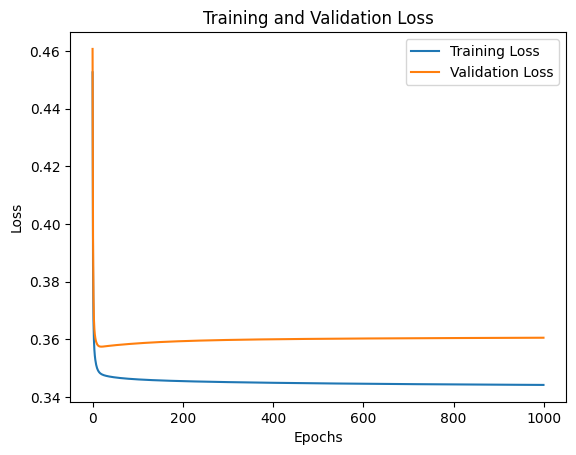

In [138]:
# Generate a sequence of integers to represent the epoch numbers
#epochs = range(1, iterations+1)

# Plot and label the training and validation loss values
plt.plot(J_train_history, label='Training Loss')
plt.plot(J_valid_history, label='Validation Loss')

# Add in a title and axes labels
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')

# Set the tick locations
#plt.xticks(np.arange(0, iterations+1, 2))

# Display the plot
plt.legend(loc='best')
plt.show()

In [139]:
def predict(X, w, b):
    # number of training examples
    m, n = X.shape
    p = np.zeros(m)

    for i in range(m):
        z_wb = 0
        # Loop over each feature
        for j in range(n):
            # Add the corresponding term to z_wb
            z_wb += X[i][j] * w[j]

        # Add bias term
        z_wb += b

        # Calculate the prediction for this example
        f_wb = sigmoid(z_wb)

        # Apply the threshold
        p[i] = f_wb >= 0.5

    return p

In [140]:
y_predicted = predict(x_train, w_final, b_final)

In [141]:
y_train.shape

(22318,)

In [142]:
y_train.reshape(-1).shape, y_predicted.shape

((22318,), (22318,))

In [143]:
(y_train.reshape(-1) == y_predicted).sum()

np.int64(18981)

In [144]:
y_train = y_train.reshape(-1)

In [145]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_train,
                                                                                                                     y_true=y_train,
                                                                                                                     y_predicted=y_predicted)

In [146]:
print(f"[TRAIN] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[TRAIN] Accuracy: 85.05% 
 Precision: 86.20% 
 Recall: 88.65% 
 F1 Score: 87.41% 
 Specificity: 79.96% 
 False Positive Rate: 20.04% 
 False Negative Rate: 11.35%


In [147]:
y_predicted_validation = predict(x_validation, w_final, b_final)

In [148]:
y_validation = y_validation.reshape(-1)

In [149]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_validation,
                                                                                                                     y_true=y_validation,
                                                                                                                     y_predicted=y_predicted_validation)

In [150]:
print(f"[VALID] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[VALID] Accuracy: 84.46% 
 Precision: 85.93% 
 Recall: 87.85% 
 F1 Score: 86.88% 
 Specificity: 79.68% 
 False Positive Rate: 20.32% 
 False Negative Rate: 12.15%


### Analyze the feature importance

In [162]:
from sklearn.preprocessing import PolynomialFeatures
X_raw      = data.drop('Depression', axis=1).values   # (N,18)
poly       = PolynomialFeatures(degree=2, include_bias=False)
X_poly_all = poly.fit_transform(X_raw)               # (N,189)
poly_names = poly.get_feature_names_out(data.drop('Depression', axis=1).columns)
print("→ #poly features:", X_poly_all.shape[1])       # 189


→ #poly features: 189


In [163]:
import numpy as np
sigma      = np.std(X_poly_all, axis=0)     # vector length=189
mask_var   = sigma != 0                     # True pentru cele cu var!=0
print("→ mask_var length :", mask_var.shape[0])  # 189
print("→ #True în mask   :", mask_var.sum())    # 169


→ mask_var length : 189
→ #True în mask   : 169


In [164]:
X_poly_clean  = X_poly_all[:, mask_var]            # (N,169)
feature_names = poly_names[mask_var]               # array length=169


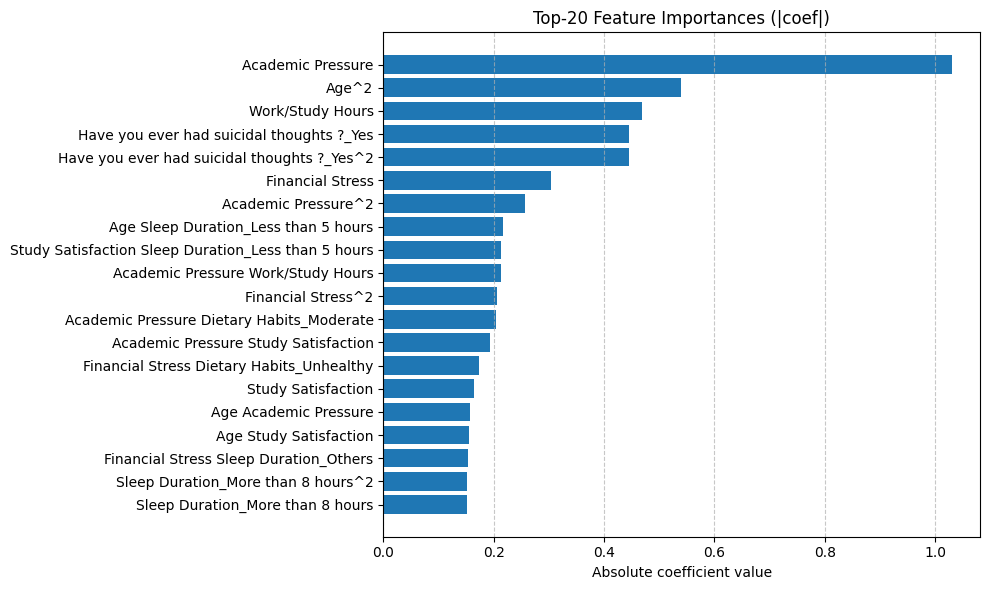

In [165]:
import pandas as pd
import matplotlib.pyplot as plt

fi = pd.DataFrame({
    'Feature'   : feature_names,
    'Importance': np.abs(w_final)
})
top20 = fi.sort_values('Importance', ascending=True).tail(20)

plt.figure(figsize=(10,6))
plt.barh(top20['Feature'], top20['Importance'])
plt.title("Top-20 Feature Importances (|coef|)")
plt.xlabel("Absolute coefficient value")
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


#### For example most important feature is obtained by multipling two features: Total day minutes and Customer service calls

### Decision Tree
#### Specialized in learning non-linear data
#### No need for Normalization/Standardization
#### No need for Polynomial Feature Transformation

### Split data into training and validation datasets: Default 80% train, 20% validation

In [166]:
x_train, x_validation, y_train, y_validation = train_test_split(x_data, y_data, test_size=0.2, random_state=42, stratify=y_data)

In [170]:
def ensure_np(a):
    return a.to_numpy() if hasattr(a, "to_numpy") else a

x_train      = ensure_np(x_train)
x_validation = ensure_np(x_validation)
y_train      = ensure_np(y_train)
y_validation = ensure_np(y_validation)

### Visualize how one sample looks like

In [171]:
x_train[0]

array([ 18.    ,   3.    ,   0.    ,   9.96  ,   5.    ,   0.    ,
         2.    ,   4.    ,   0.    ,   1.    ,   0.    ,   0.    ,
         0.    ,   0.    ,   0.    ,   0.    ,   1.    ,   1.    ,
       324.    ,  54.    ,   0.    , 179.28  ,  90.    ,   0.    ,
        36.    ,  72.    ,   0.    ,  18.    ,   0.    ,   0.    ,
         0.    ,   0.    ,   0.    ,   0.    ,  18.    ,  18.    ,
         9.    ,   0.    ,  29.88  ,  15.    ,   0.    ,   6.    ,
        12.    ,   0.    ,   3.    ,   0.    ,   0.    ,   0.    ,
         0.    ,   0.    ,   0.    ,   3.    ,   3.    ,   0.    ,
         0.    ,   0.    ,   0.    ,   0.    ,   0.    ,   0.    ,
         0.    ,   0.    ,   0.    ,   0.    ,   0.    ,   0.    ,
         0.    ,   0.    ,   0.    ,  99.2016,  49.8   ,   0.    ,
        19.92  ,  39.84  ,   0.    ,   9.96  ,   0.    ,   0.    ,
         0.    ,   0.    ,   0.    ,   0.    ,   9.96  ,   9.96  ,
        25.    ,   0.    ,  10.    ,  20.    ,   0.    ,   5. 

### Visualize the nuber of training samples and number of validation samples

In [172]:
len(y_train), len(y_validation)

(22318, 5580)

In [173]:
np.unique(y_train, return_counts=True)

(array([0, 1]), array([ 9250, 13068]))

In [174]:
np.unique(y_validation, return_counts=True)

(array([0, 1]), array([2313, 3267]))

In [175]:
from sklearn.tree import DecisionTreeClassifier, export_text
from sklearn.metrics import accuracy_score

### Decision Tree Code and Implementation

#### Declare Decision Tree with corresponding Hyperparameters

In [176]:
classifier = DecisionTreeClassifier(criterion='entropy', min_samples_split=2, max_depth=5)

In [177]:
type(x_train)

numpy.ndarray

#### Train the Decision Tree

In [178]:
classifier.fit(x_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=5)

#### Predict on the training dataset

In [179]:
y_predicted = classifier.predict(x_train)
y_predicted = np.array(y_predicted)

### Display training metrics

In [180]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_train,
                                                                                                                     y_true=y_train.reshape(-1),
                                                                                                                     y_predicted=y_predicted)

In [181]:
print(f"[TRAIN] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[TRAIN] Accuracy: 83.77% 
 Precision: 85.68% 
 Recall: 86.78% 
 F1 Score: 86.23% 
 Specificity: 79.51% 
 False Positive Rate: 20.49% 
 False Negative Rate: 13.22%


### Display validation metrics

In [182]:
y_predicted_valid = classifier.predict(x_validation)
y_predicted_valid = np.array(y_predicted_valid)

In [183]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_validation,
                                                                                                                     y_true=y_validation.reshape(-1),
                                                                                                                     y_predicted=y_predicted_valid)

In [184]:
print(f"[VALID] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[VALID] Accuracy: 82.69% 
 Precision: 84.39% 
 Recall: 86.41% 
 F1 Score: 85.39% 
 Specificity: 77.43% 
 False Positive Rate: 22.57% 
 False Negative Rate: 13.59%


### Display Decision Tree and Learned rules by the Tree

In [185]:
list(x_data.columns)

['Age',
 'Academic Pressure',
 'Work Pressure',
 'CGPA',
 'Study Satisfaction',
 'Job Satisfaction',
 'Work/Study Hours',
 'Financial Stress',
 'Gender_Male',
 'Sleep Duration_7-8 hours',
 'Sleep Duration_Less than 5 hours',
 'Sleep Duration_More than 8 hours',
 'Sleep Duration_Others',
 'Dietary Habits_Moderate',
 'Dietary Habits_Others',
 'Dietary Habits_Unhealthy',
 'Have you ever had suicidal thoughts ?_Yes',
 'Family History of Mental Illness_Yes',
 'Age^2',
 'Age Academic Pressure',
 'Age Work Pressure',
 'Age CGPA',
 'Age Study Satisfaction',
 'Age Job Satisfaction',
 'Age Work/Study Hours',
 'Age Financial Stress',
 'Age Gender_Male',
 'Age Sleep Duration_7-8 hours',
 'Age Sleep Duration_Less than 5 hours',
 'Age Sleep Duration_More than 8 hours',
 'Age Sleep Duration_Others',
 'Age Dietary Habits_Moderate',
 'Age Dietary Habits_Others',
 'Age Dietary Habits_Unhealthy',
 'Age Have you ever had suicidal thoughts ?_Yes',
 'Age Family History of Mental Illness_Yes',
 'Academic Pre

In [186]:
from sklearn.tree import plot_tree


In [187]:
fig, axes = plt.subplots(nrows = 1,ncols = 1, figsize=(70,50), dpi=300)
plot_tree(classifier, filled=True, fontsize=20, feature_names=list(x_data.columns),rounded=True, ax=axes)
plt.savefig('decisionTree.png')

In [188]:
text_representation = export_text(classifier, feature_names=list(x_data.columns), class_names=['No Churn', 'Churn'])
print(text_representation)

|--- Academic Pressure Have you ever had suicidal thoughts ?_Yes <= 1.50
|   |--- Academic Pressure Financial Stress <= 9.50
|   |   |--- Financial Stress Have you ever had suicidal thoughts ?_Yes <= 2.50
|   |   |   |--- Work/Study Hours Dietary Habits_Unhealthy <= 6.50
|   |   |   |   |--- Academic Pressure CGPA <= 27.73
|   |   |   |   |   |--- class: No Churn
|   |   |   |   |--- Academic Pressure CGPA >  27.73
|   |   |   |   |   |--- class: No Churn
|   |   |   |--- Work/Study Hours Dietary Habits_Unhealthy >  6.50
|   |   |   |   |--- Age Dietary Habits_Unhealthy <= 29.50
|   |   |   |   |   |--- class: No Churn
|   |   |   |   |--- Age Dietary Habits_Unhealthy >  29.50
|   |   |   |   |   |--- class: No Churn
|   |   |--- Financial Stress Have you ever had suicidal thoughts ?_Yes >  2.50
|   |   |   |--- Work/Study Hours Dietary Habits_Unhealthy <= 2.50
|   |   |   |   |--- CGPA Financial Stress <= 32.00
|   |   |   |   |   |--- class: No Churn
|   |   |   |   |--- CGPA Financi

In [189]:
from sklearn.tree import _tree

In [190]:
def get_rules(tree, feature_names, class_names):
    tree_ = tree.tree_
    feature_name = [
        feature_names[i] if i != _tree.TREE_UNDEFINED else "undefined!"
        for i in tree_.feature
    ]

    paths = []
    path = []

    def recurse(node, path, paths):

        if tree_.feature[node] != _tree.TREE_UNDEFINED:
            name = feature_name[node]
            threshold = tree_.threshold[node]
            p1, p2 = list(path), list(path)
            p1 += [f"({name} <= {np.round(threshold, 3)})"]
            recurse(tree_.children_left[node], p1, paths)
            p2 += [f"({name} > {np.round(threshold, 3)})"]
            recurse(tree_.children_right[node], p2, paths)
        else:
            path += [(tree_.value[node], tree_.n_node_samples[node])]
            paths += [path]

    recurse(0, path, paths)

    # sort by samples count
    samples_count = [p[-1][1] for p in paths]
    ii = list(np.argsort(samples_count))
    paths = [paths[i] for i in reversed(ii)]

    rules = []
    for path in paths:
        rule = "if "

        for p in path[:-1]:
            if rule != "if ":
                rule += " and "
            rule += str(p)
        rule += " then "
        if class_names is None:
            rule += "response: "+str(np.round(path[-1][0][0][0],3))
        else:
            classes = path[-1][0][0]
            l = np.argmax(classes)
            rule += f"class: {class_names[l]} (proba: {np.round(100.0*classes[l]/np.sum(classes),2)}%)"
        rule += f" | based on {path[-1][1]:,} samples"
        rules += [rule]

    return rules

In [191]:
rules = get_rules(classifier, feature_names=list(x_data.columns), class_names=['No Churn', 'Churn'])
for r in rules:
    print(r)

if (Academic Pressure Have you ever had suicidal thoughts ?_Yes <= 1.5) and (Academic Pressure Financial Stress <= 9.5) and (Financial Stress Have you ever had suicidal thoughts ?_Yes <= 2.5) and (Work/Study Hours Dietary Habits_Unhealthy <= 6.5) and (Academic Pressure CGPA <= 27.735) then class: No Churn (proba: 92.57%) | based on 4,856 samples
if (Academic Pressure Have you ever had suicidal thoughts ?_Yes > 1.5) and (Academic Pressure Financial Stress > 9.5) and (Academic Pressure Work/Study Hours > 19.0) and (Age Study Satisfaction <= 97.5) and (Academic Pressure Financial Stress <= 18.0) then class: Churn (proba: 95.54%) | based on 2,822 samples
if (Academic Pressure Have you ever had suicidal thoughts ?_Yes > 1.5) and (Academic Pressure Financial Stress > 9.5) and (Academic Pressure Work/Study Hours > 19.0) and (Age Study Satisfaction <= 97.5) and (Academic Pressure Financial Stress > 18.0) then class: Churn (proba: 98.76%) | based on 1,933 samples
if (Academic Pressure Have you 